In [1]:
import os
import sys

project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.append(project_root)

from plots import ForexPlotter

from data_handle import (
    ForexDataClean,
    ForexDataLoad,
)

from features import (
    ForexMomentumIndicators,
    ForexTrendIndicators,
    ForexVolatilityIndicators,
    ForexVolumeIndicators,
    ForexMASignals,
    ForexMACDSignals,
    ForexADXSignals,
    ForexParabolicSARSignals,
    ForexRSISignals,
    ForexStochasticSignals,
    ForexWilliamsRSignals,
    ForexCCISignals,
    ForexATRSignals
)

import warnings
warnings.filterwarnings('ignore')

data = ForexDataLoad(file_path = '../data/xauaud.csv').data
ohlcv_data = ForexDataLoad(file_path = '../data/xauaud.csv').data

cleaner = ForexDataClean(data = data)
data = cleaner.fast_cleaner()

trend_data = ForexTrendIndicators(data = data).generate_all_trend_indicators(
    ema_periods = [[5, 10, 20, 50], [100, 200]],
    sma_periods = [[5, 10, 20, 50], [100, 200]],
    macd_fast_slow_signal = [[12,26,9], [6,13,4], [24,36,8], [7,19,4]], 
    adx_periods = [ 7, 14, 21, 28],
    sar_acc_max = [[0.02, 0.2], [0.04, 0.4], [0.06, 0.6], [0.01, 0.01]]
)

FOREX DATA LOADER
 Available Fuctions 
1 load_csv 
2 load_from_database
Data loaded successfully!
Shape: (38217, 5)

FOREX DATA LOADER
 Available Fuctions 
1 load_csv 
2 load_from_database
Data loaded successfully!
Shape: (38217, 5)

FOREX DATA CLEANER
 Available Fuctions 
1 remove_duplicates 
2 handle_missing_values 
3 validate_ohlc_integrity 
4 handle_outliers 
5 fast_cleaner
Keep = first and subset = None
Removed 0 duplicate entries
OHLC DATA INTEGRITY VALIDATION
No OHLC integrity violations found
All OHLC values are consistent
Found 1 missing values
 dropped: 1 missing values .
OHLC DATA INTEGRITY VALIDATION
No OHLC integrity violations found
All OHLC values are consistent
TREND INDICATORS
 Available Fuctions: 
1 add_sma 
2 add_ema 
3 add_macd 
4 add_adx 
5 add_parabolic_sar 
6 generate_all_trend_indicators
Data Info
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 38216 entries, 2017-04-24 02:00:00 to 2025-09-05 20:00:00
Data columns (total 75 columns):
 #   Column            

In [2]:
ma_signals = ForexMASignals(
    data = trend_data[0],
    ema_parameters = trend_data[1]['ema_params'],
    sma_parameters = trend_data[1]['sma_params']
)

EMA/SMA SIGNAL GENERATION
 Available Fuctions: 
1 golden_death_cross 
2 ema_crossover 
3 trend_hierarchy 
4 ma_bounce_signals 
5 ma_slope_signals 
6 price_extension_signals 
7 generate_all_signals


In [3]:
trend_signals_data = ma_signals.generate_all_signals()

Data Info
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 38216 entries, 2017-04-24 02:00:00 to 2025-09-05 20:00:00
Columns: 120 entries, close to sma_200_overbought_oversold
dtypes: float64(1), int64(119)
memory usage: 35.3 MB
None
Shape of data (38216, 120)
0 rows removed


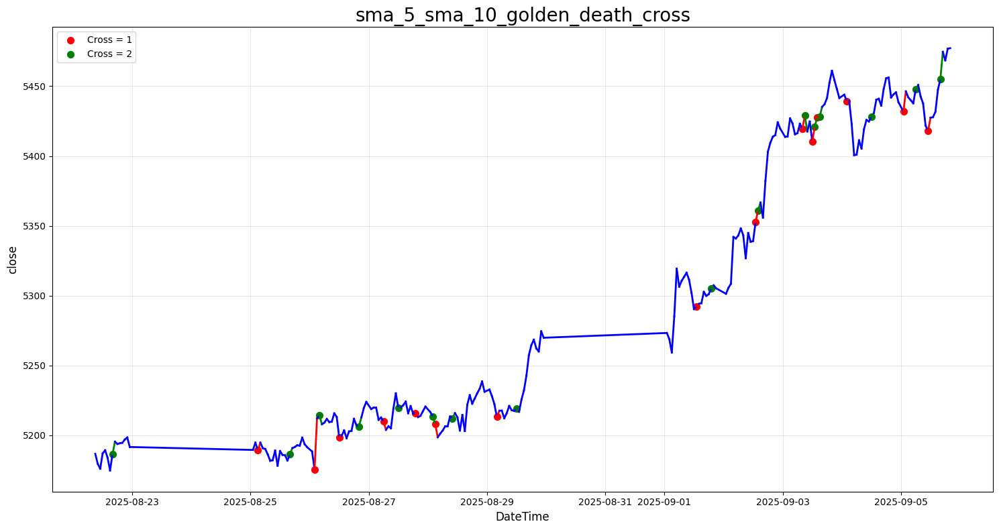

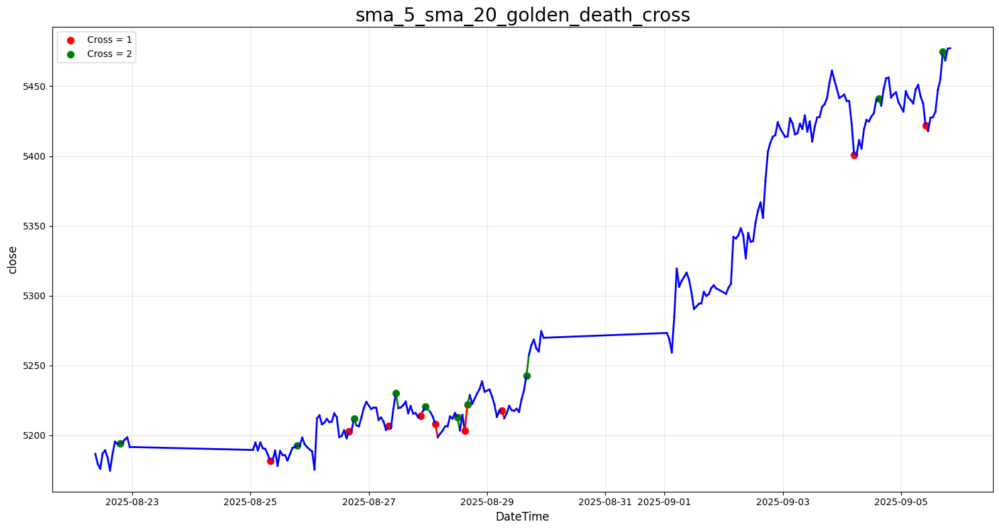

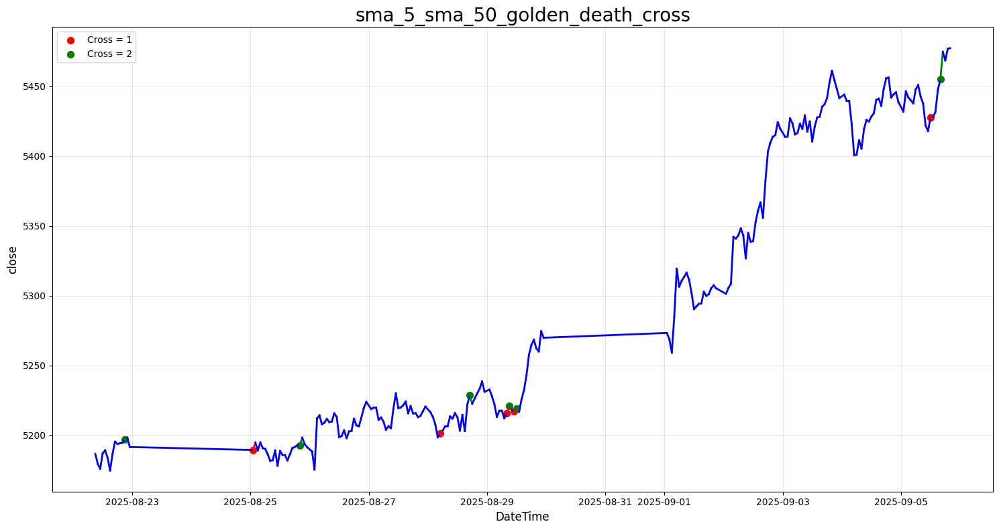

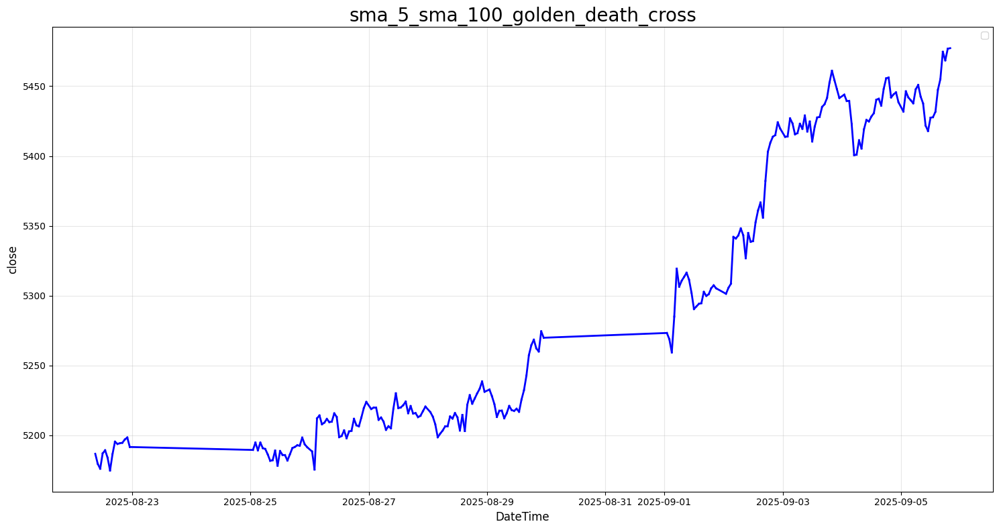

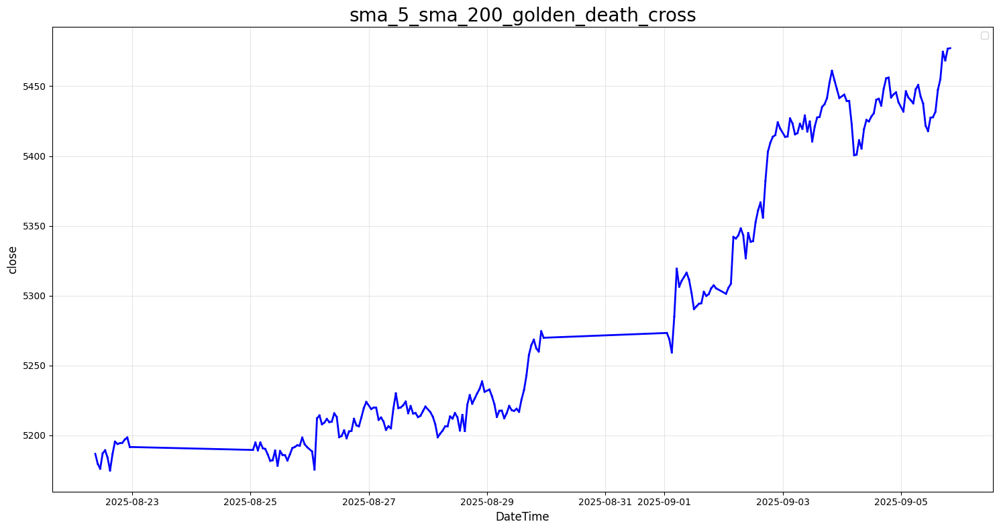

...

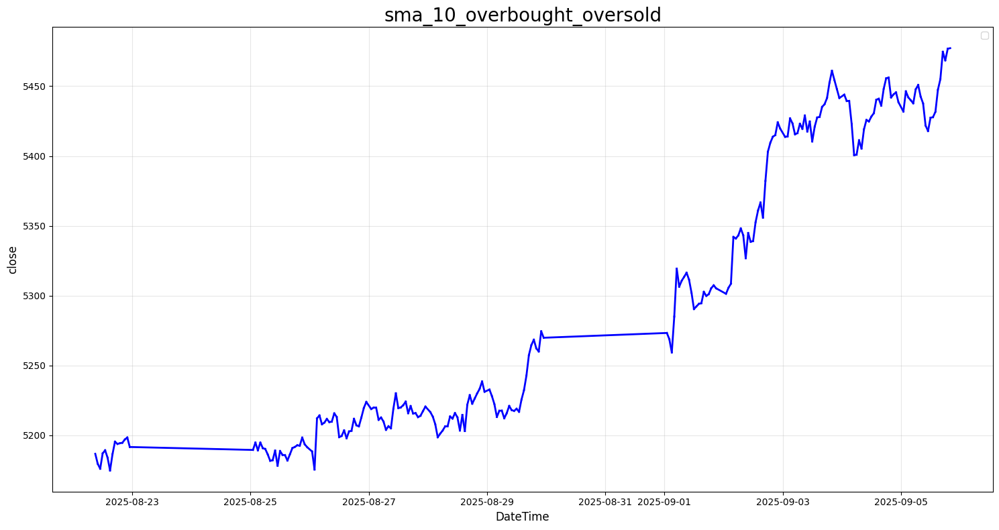

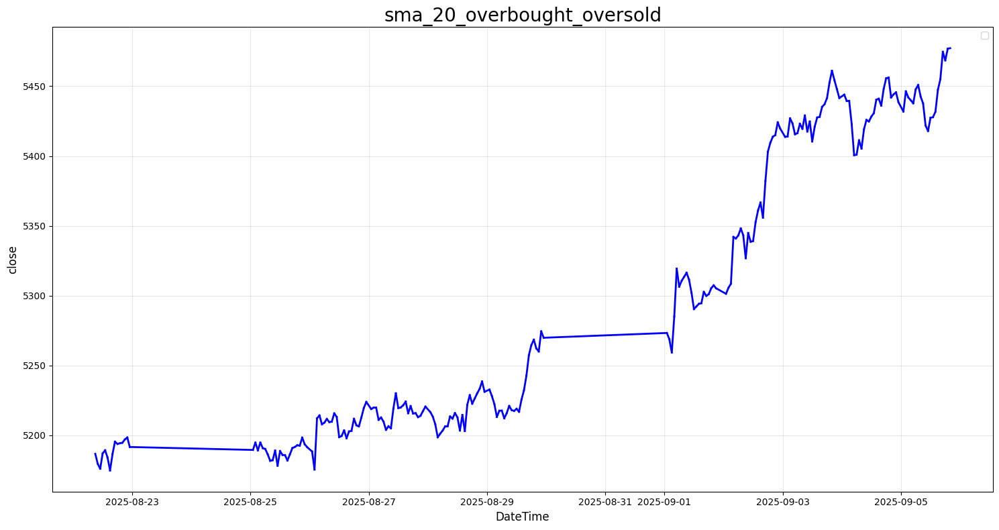

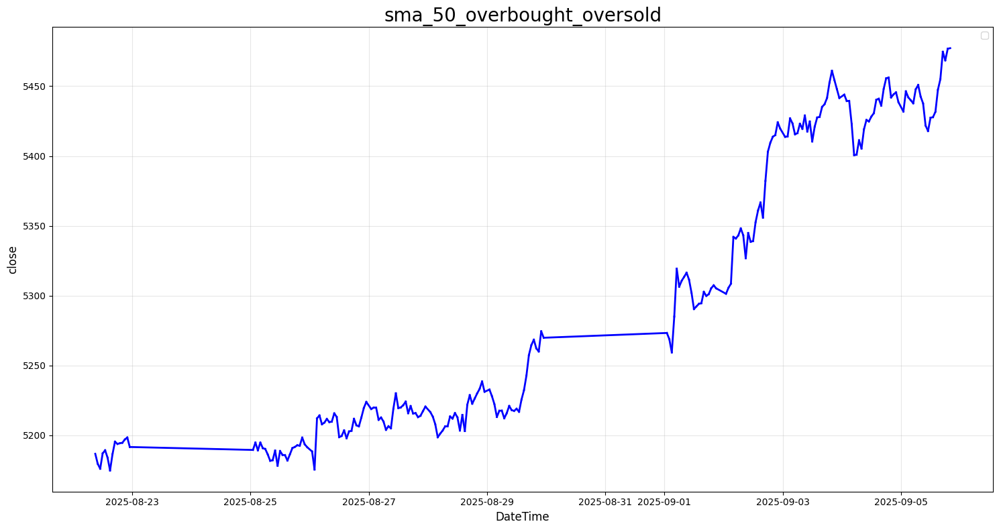

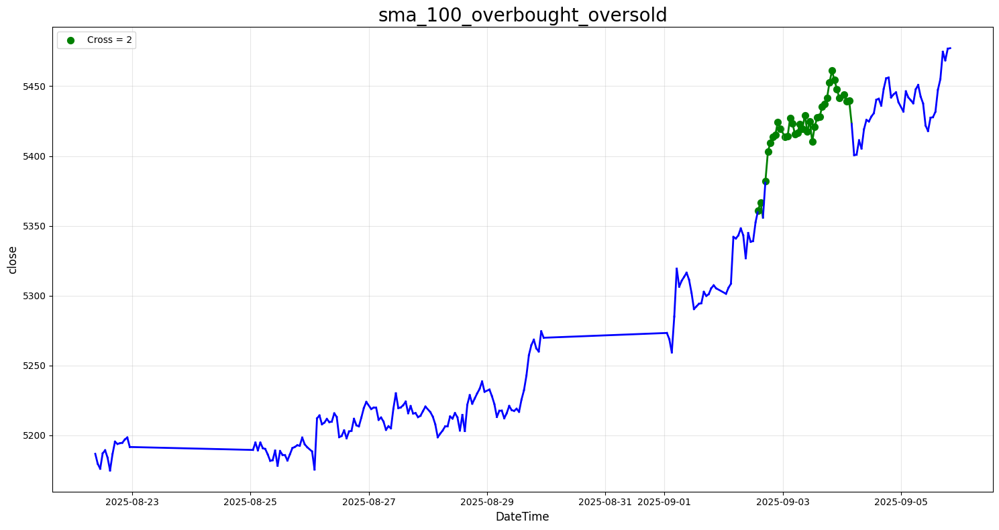

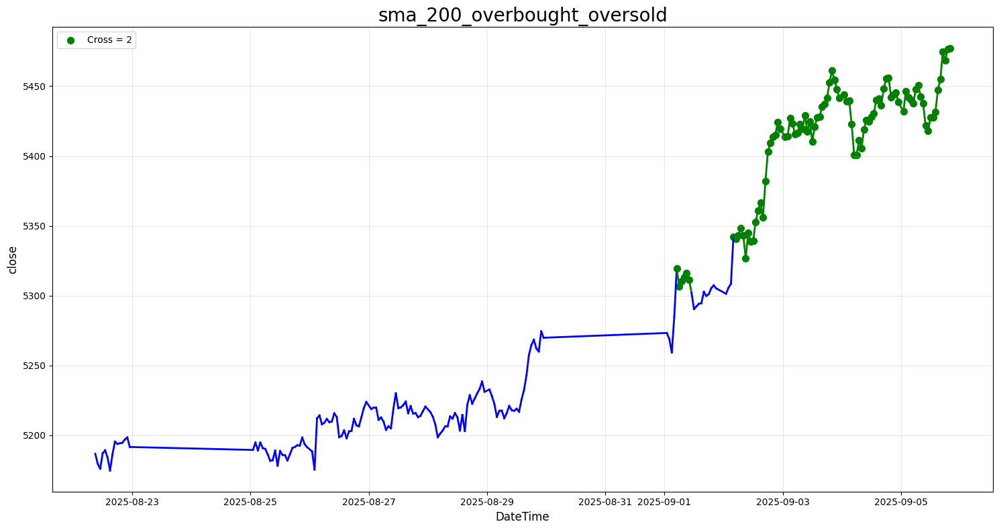

In [4]:
plotter = ForexPlotter(data = trend_signals_data)
plotter.plot_signals(periods = 240)